In [1]:
import numpy as np 
from matplotlib import pyplot as plt
from hammer import dm
from time import time
from os.path import join, abspath
root_dir = abspath(join('..', '..'))
import sys
sys.path.append(root_dir)

In [2]:
from utils import style

In [3]:
style()

In [4]:
data_dir = join(root_dir, 'Data', 'MCMC', 'dm', 'simulation')
data_dir

'/home2/s20321005/Thesis-Project/Data/MCMC/dm/simulation'

In [5]:
rhob = [
    0.0104, 0.0277, 0.0073, 0.0005, 0.0006, 0.0018,
    0.0018, 0.0029, 0.0072, 0.0216, 0.0056, 0.0015
]
sigmaz = [
    3.7, 7.1, 22.1, 39.0, 15.5, 7.5, 12.0, 
    18.0, 18.5, 18.5, 20.0, 20.0]
rhoDM = [0.016]
log_nu0 = [1]
R = [3.4E-3]
zsun = [20]
w0 = [-7.]
log_sigmaw = [np.log(5.)]
log_a = [np.log(1.)]

theta = np.array([rhob + sigmaz + rhoDM + log_nu0 + R + zsun+w0 + log_sigmaw + log_a]).flatten()

In [6]:
C_pc_Myr = 3.086E13 / (1E6 * 365.25 * 24 * 60 * 60)

In [11]:
N = 50000
z0 = np.random.rand(N)*300-150 # pc
vz0 = np.random.rand(N)*20-10 # km/s
# z0 = np.random.randn(N)*100 # pc
# vz0 = np.random.randn(N)*10 # km/s
# n1 = np.floor(N*0.6).astype(int)
# n2 = N - n1
# vz01 = np.random.randn(n1)*6
# vz02 = np.random.randn(n2)*20
# vz0 = np.concatenate([vz01, vz02])
# # convert vz0 from km/s to pc/Myr
vz0 = vz0 / C_pc_Myr

In [12]:
dz = 1
z_start = 0
z_end = 2000
dt = 1
t_end = 2000 

t0 = time()
sol = dm.run_simulation(theta, z_start, z_end, dz, z0, vz0, dt, t_end, parallel=True, 
                        batch=100)
t1 = time()
print('Simulation took {:.2f} seconds'.format(t1-t0))

Simulation took 198.15 seconds


In [10]:
np.save(join(data_dir, "data", "uni-uni.npy"), sol)

In [ ]:
# sol = np.load(join(data_dir, 'sol.npy'))

In [11]:
t = sol[0, :, 0] # Myr
z = sol[:, :, 1] # pc
vz = sol[:, :, 2] # pc/Myr
# convert vz from pc/Myr to km/s
vz = vz * C_pc_Myr

In [12]:
import imageio

# create gif function from matplotlib with rate
def create_gif(images, gif_name, rate=30):
    # rate in frames per second
    imageio.mimsave(gif_name, images, fps=rate)
    

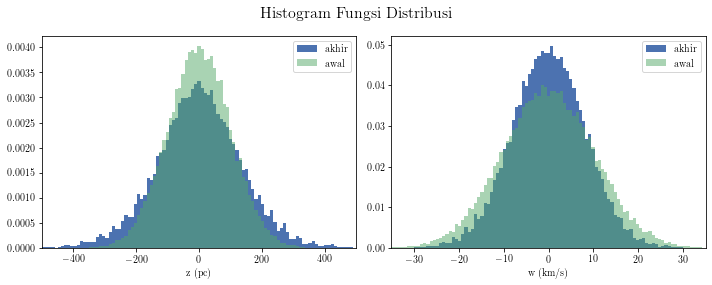

In [13]:
z_0 = sol[:, 0, 1] # pc
vz_0 = sol[:, 0, 2] # pc/Myr

z = sol[:, -1, 1] # pc
vz = sol[:, -1, 2] # pc/Myr
# convert vz from pc/Myr to km/s
vz = vz * C_pc_Myr

zs = np.linspace(-500, 500, 100)
ws = np.linspace(-35, 35, 100)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].hist(z, bins=zs, density=True, label="akhir")
axes[0].hist(z_0, bins=zs, density=True, label="awal", alpha=0.5)
axes[0].set_xlabel('z (pc)')
axes[0].set_xlim(zs.min(), zs.max())
axes[0].legend()
axes[1].hist(vz, bins=ws, density=True, label="akhir")
axes[1].hist(vz_0, bins=ws, density=True, label="awal", alpha=0.5)
axes[1].set_xlabel('w (km/s)')
axes[1].set_xlim(ws.min(), ws.max())
axes[1].legend()
fig.suptitle('Histogram Fungsi Distribusi', fontsize=16)
fig.tight_layout()
# fig.savefig("hist-norm.pdf", dpi=300)
plt.show()

In [18]:
sol.shape

(5000, 2001, 3)

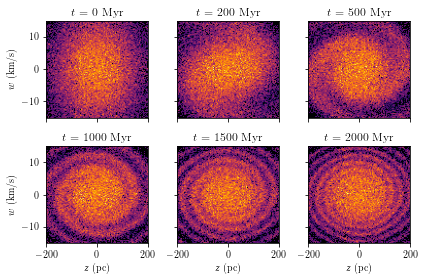

In [26]:
# plot 2D heatmap of z and vz, in log scale
zedge = np.linspace(-200, 200, 100)
vzedge = np.linspace(-15, 15, 100)

t = sol[0, :, 0] # Myr

fig, axes = plt.subplots(2, 3, figsize=(6, 4), sharex=True, sharey=True)
for index, ax in zip([0, 200, 500, 1000, 1500, 2000], axes.flatten()):
    ti = t[index]
    z = sol[:, index, 1] # pc
    vz = sol[:, index, 2] # pc/Myr

    H, zedge, vzedge = np.histogram2d(z, vz, bins=(zedge, vzedge))
    # H = np.log(H.T)
    H = H.T**(1/2)
    extent = [zedge[0], zedge[-1], vzedge[0], vzedge[-1]]
    im = ax.imshow(H, extent=extent, origin='lower', aspect='auto', cmap='inferno')
    if index in [0, 1000]:
        ax.set_ylabel(r'$w$ (km/s)')
    if index in [1000, 1500, 2000]:
        ax.set_xlabel(r'$z$ (pc)')
    ax.set_title(r'$t$ = {:.0f} Myr'.format(ti))
# fig.colorbar(im, ax=ax)
fig.tight_layout()
# fig.savefig(join(data_dir, "heatmap-norm-norm.pdf"), dpi=200)
plt.show()

<ipython-input-75-a2854fe12ffa>:12: UserWarning: The following kwargs were not used by contour: 'aspect'
  ax.contour(H.T, extent=extent, origin='lower', aspect='auto', cmap='viridis')


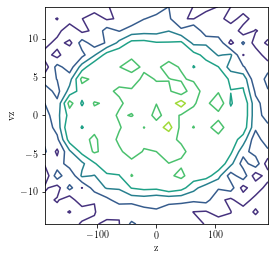

In [75]:
# # plot 2D heatmap of z and vz, in log scale
# zedge = np.linspace(-200,200, 20)
# vzedge = np.linspace(-15, 15, 20)

# z = sol[:, -1, 1] # pc
# vz = sol[:, -1, 2] # pc/Myr

# H, zedge, vzedge = np.histogram2d(z, vz, bins=(zedge, vzedge))
# extent = [zedge[0], zedge[-1], vzedge[0], vzedge[-1]]
# # plot contour
# fig, ax = plt.subplots(1, 1, figsize=(4, 4))
# ax.contour(H.T, extent=extent, origin='lower', aspect='auto', cmap='viridis')
# ax.set_xlabel('z')
# ax.set_ylabel('vz')
# plt.show()


In [14]:
# move the first axis to second axis
sol2 = np.moveaxis(sol, 0, 1)
sol2.shape

(2001, 50000, 3)

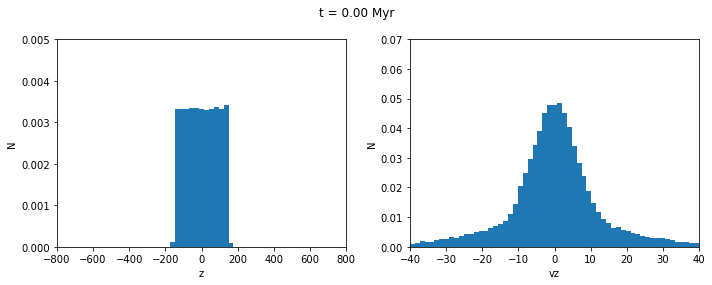

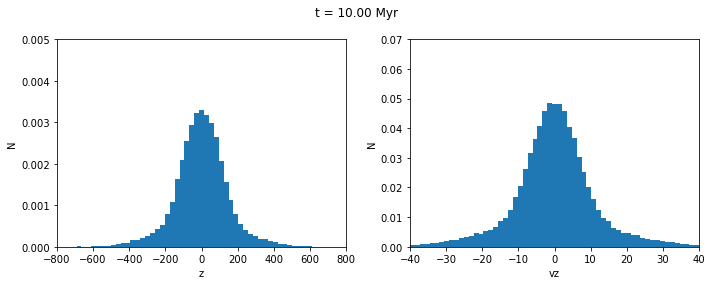

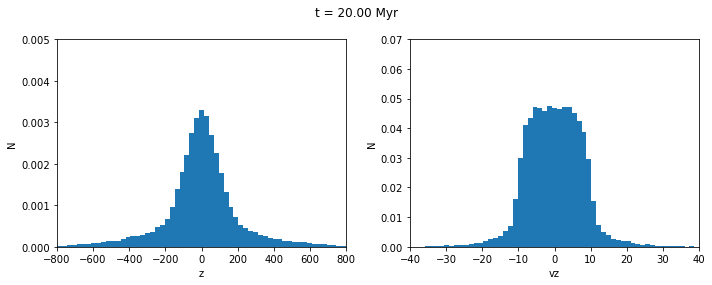

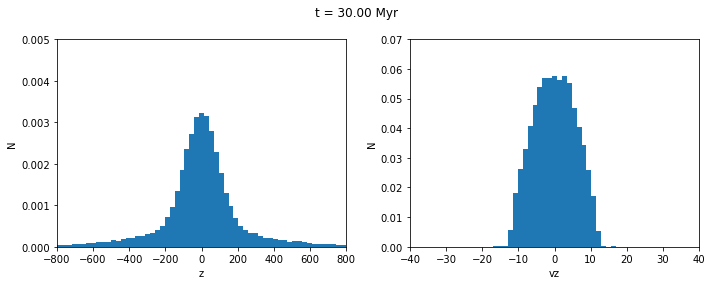

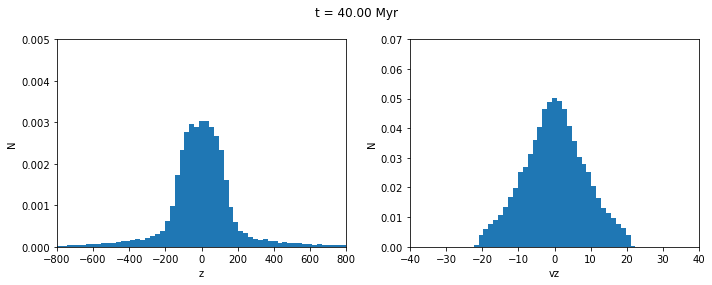

...

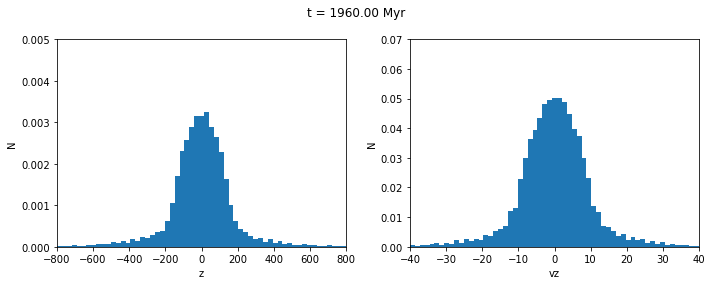

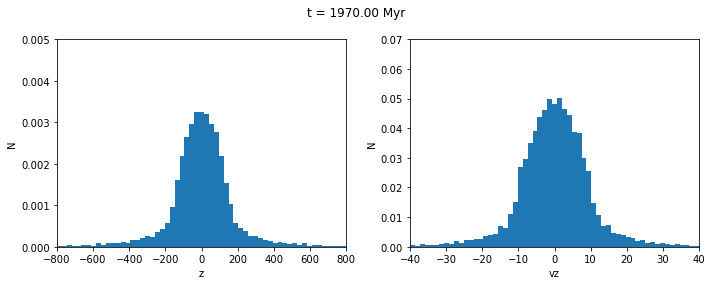

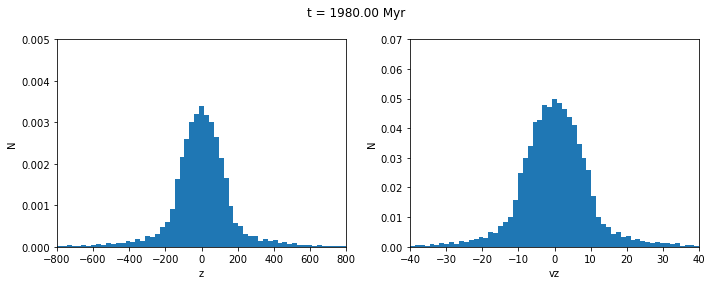

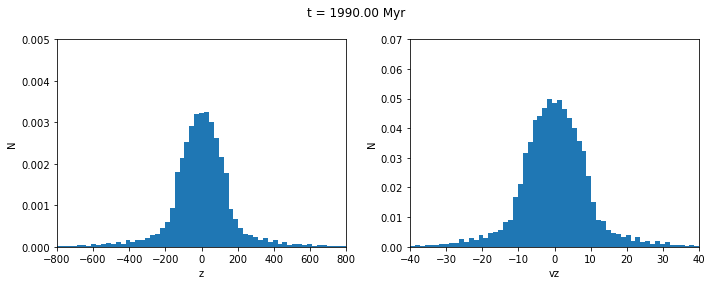

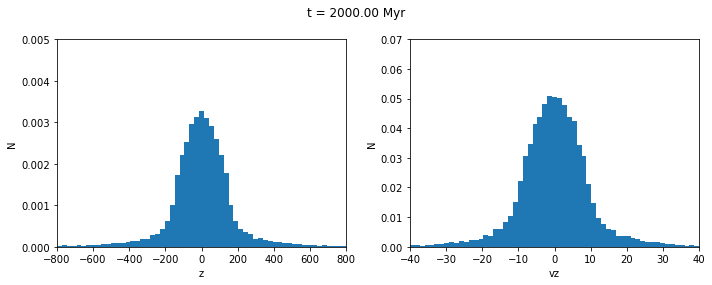

In [33]:
path = join(data_dir, 'plots')
for i, s in enumerate(sol2[::10, :, :]):
    t = s[:, 0] # Myr
    t = t[i*10]
    z = s[:, 1] # pc
    vz = s[:, 2] # pc/Myr
    # convert vz from pc/Myr to km/s
    vz = vz * C_pc_Myr
    zs = np.linspace(-800, 800, 60)
    vzs = np.linspace(-40, 40, 60)
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].hist(z, bins=zs, density=True)
    axes[0].set_xlabel('z')
    axes[0].set_ylabel('N')
    axes[0].set_xlim(zs.min(), zs.max())
    axes[0].set_ylim(0, 0.005)
    # axes[0].set_yscale("log")
    axes[1].hist(vz, bins=vzs, density=True)
    axes[1].set_xlabel('vz')
    axes[1].set_ylabel('N')
    # axes[1].set_yscale("log")
    axes[1].set_xlim(vzs.min(), vzs.max())
    axes[1].set_ylim(0, 0.07)
    fig.suptitle(f"t = {t:.2f} Myr")
    fig.tight_layout()
    fig.savefig(join(path, f"simulation_{i:04d}.png"), dpi=150)
    plt.show()

In [15]:
from glob import glob

path = join(data_dir, 'plots')
images = glob(join(path, "*.png"))
images.sort()
images = [imageio.imread(image) for image in images]
create_gif(images, join(data_dir, "simulation-norm-norm.gif"), rate=15)

<ipython-input-15-78d8017daca7>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image) for image in images]


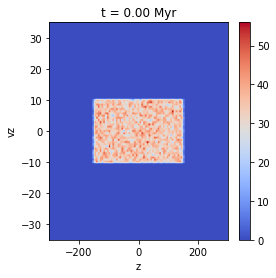

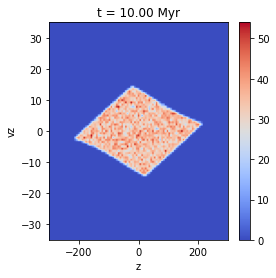

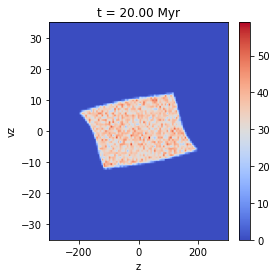

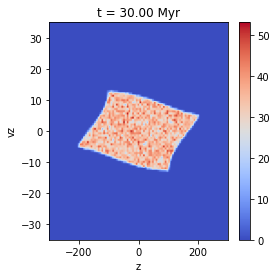

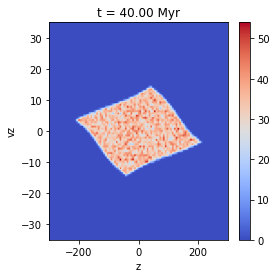

...

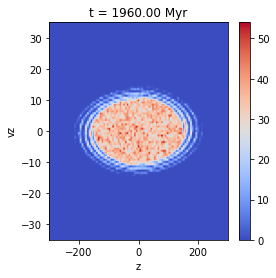

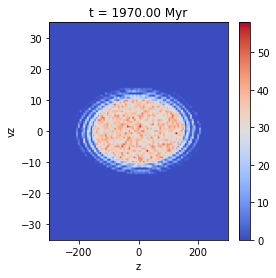

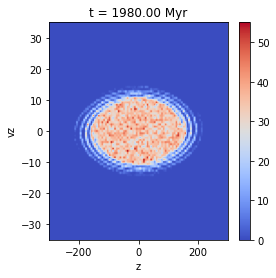

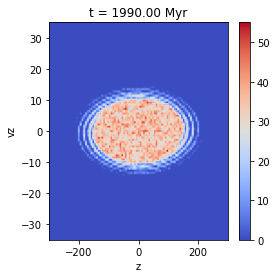

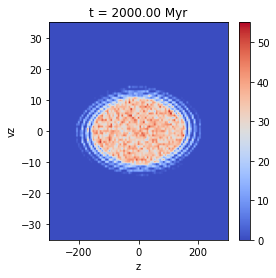

In [42]:
from os.path import join

path_snail = join(data_dir, 'snail')
zedge = np.linspace(-300, 300, 100)
vzedge = np.linspace(-35, 35, 100)
for i, s in enumerate(sol2[::10, :, :]):
    t = s[:, 0] # Myr
    t = t[i*10]
    z = s[:, 1] # pc
    vz = s[:, 2] # pc/Myr
    H, zedge, vzedge = np.histogram2d(z, vz, bins=(zedge, vzedge))
    # H = np.log(H.T)
    H = H.T**(1/1)
    extent = [zedge[0], zedge[-1], vzedge[0], vzedge[-1]]

    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    im = ax.imshow(H, extent=extent, origin='lower', aspect='auto', cmap='coolwarm')
    ax.set_xlabel('z')
    ax.set_ylabel('vz')
    ax.set_title('t = {:.2f} Myr'.format(t))
    fig.colorbar(im, ax=ax)
    fig.savefig(join(path_snail, 'snail_{:05d}.png'.format(i)))
    plt.show()

In [43]:
from glob import glob

images = glob(join(path_snail, "*.png"))
images.sort()
images = [imageio.imread(image) for image in images]
create_gif(images, join(data_dir, "simulation-snail-uni.gif"), rate=15)

<ipython-input-43-f534ff8e163a>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image) for image in images]


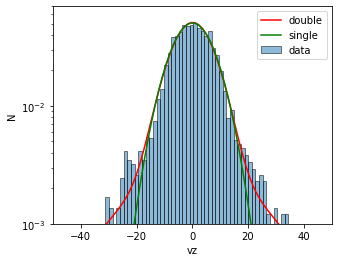

(array([0.94875745, 0.08681557, 7.47710248]),
 array([ 0.08094037,  0.85442771,  7.05087122,  0.14998356, 21.4943899 ]))

In [88]:
from scipy.stats import norm

z = sol[:, -1, 1] # pc
vz = sol[:, -1, 2] # pc/Myr
# convert vz from pc/Myr to km/s
vz = vz * C_pc_Myr

vz_num, vz_edge = np.histogram(vz, bins=100, density=True)
vzs = (vz_edge[1:] + vz_edge[:-1]) / 2
dv = vz_edge[1] - vz_edge[0]
def double_gauss(x, mu, a1, sigma1, a2, sigma2):
    return a1 * norm.pdf(x, mu, sigma1) + a2 * norm.pdf(x, mu, sigma2)

def single_gauss(x, a, mu, sigma):
    return a * norm.pdf(x, mu, sigma)

from scipy.optimize import curve_fit

popt2, _ = curve_fit(double_gauss, vzs, vz_num, p0=[0, 1, 10, 1, 10])
popt, _ = curve_fit(single_gauss, vzs, vz_num, p0=[1, 0, 10])

plt.figure(figsize=(5, 4))
plt.bar(vzs, vz_num, width=dv, label="data", alpha=0.5, ec="k")
plt.plot(vzs, double_gauss(vzs, *popt2), c="r", label="double")
plt.plot(vzs, single_gauss(vzs, *popt), c="g", label="single")
plt.xlim(-50, 50)
plt.ylim(1e-3, 7e-2)
plt.xlabel('vz')
plt.ylabel('N')
plt.legend()
plt.yscale("log")
plt.show()
popt, popt2